In [1]:
import pandas as pd
import numpy as np
import zipfile
import os
import cv2

In [2]:
zip_name='Pistachio.zip'
with zipfile.ZipFile(zip_name, 'r') as zip_ref:
    file_name=zip_ref.namelist()
    zip_ref.extractall()

In [3]:
print(file_name)

['Pistachio/kirmizi (1).jpg', 'Pistachio/kirmizi (10).jpg', 'Pistachio/kirmizi (11).jpg', 'Pistachio/kirmizi (12).jpg', 'Pistachio/kirmizi (13).jpg', 'Pistachio/kirmizi (14).jpg', 'Pistachio/kirmizi (15).jpg', 'Pistachio/kirmizi (16).jpg', 'Pistachio/kirmizi (17).jpg', 'Pistachio/kirmizi (18).jpg', 'Pistachio/kirmizi (19).jpg', 'Pistachio/kirmizi (2).jpg', 'Pistachio/kirmizi (20).jpg', 'Pistachio/kirmizi (21).jpg', 'Pistachio/kirmizi (22).jpg', 'Pistachio/kirmizi (23).jpg', 'Pistachio/kirmizi (24).jpg', 'Pistachio/kirmizi (25).jpg', 'Pistachio/kirmizi (26).jpg', 'Pistachio/kirmizi (27).jpg', 'Pistachio/kirmizi (28).jpg', 'Pistachio/kirmizi (29).jpg', 'Pistachio/kirmizi (3).jpg', 'Pistachio/kirmizi (30).jpg', 'Pistachio/kirmizi (31).jpg', 'Pistachio/kirmizi (32).jpg', 'Pistachio/kirmizi (33).jpg', 'Pistachio/kirmizi (34).jpg', 'Pistachio/kirmizi (35).jpg', 'Pistachio/kirmizi (36).jpg', 'Pistachio/kirmizi (37).jpg', 'Pistachio/kirmizi (38).jpg', 'Pistachio/kirmizi (39).jpg', 'Pistachio/k

In [4]:
X = []
for file_path in file_name:
        image = cv2.imread(file_path)
        image = cv2.resize(image, (500, 500))
        hist = cv2.calcHist([image], [0, 1, 2], None, [8, 8, 8], [0, 256, 0, 256, 0, 256])
        cv2.normalize(hist, hist)
        histogram_features = hist.flatten()
        image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        hue_features = cv2.HuMoments(cv2.moments(image_gray)).flatten()
        current_features = np.hstack([histogram_features, hue_features])
        X.append(current_features)

In [5]:
X

[array([9.93244231e-01, 5.04851187e-06, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.000000

In [6]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()

In [7]:
X=sc.fit_transform(X)

## LocalOutlierFactor

In [8]:
from sklearn.neighbors import LocalOutlierFactor

In [9]:
lof = LocalOutlierFactor(n_neighbors=5, contamination=0.02, n_jobs=-1)
y_pred = lof.fit_predict(X)

In [10]:
np.unique(y_pred, return_counts=True)

(array([-1,  1]), array([  43, 2105], dtype=int64))

## AngelBaseOutlierDetection

In [11]:
from pyod.models import abod

In [12]:
abod_od = abod.ABOD(n_neighbors=10, contamination=0.008)
y_pred1 = abod_od.fit_predict(X)

C:\Users\mahdi\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function fit_predict is deprecated
  warnings.warn(msg, category=FutureWarning)


In [13]:
np.unique(y_pred1, return_counts=True)

(array([0, 1]), array([2130,   18], dtype=int64))

## IsolationForest

In [14]:
from sklearn.ensemble import IsolationForest

In [15]:
IF = IsolationForest(contamination=0.017)
y_pred2 = IF.fit_predict(X)

In [16]:
np.unique(y_pred2, return_counts=True)

(array([-1,  1]), array([  37, 2111], dtype=int64))

In [17]:
y_pred2.shape

(2148,)

In [24]:
data={
    'path_of_files':file_name,
    'class':y_pred1
}
df=pd.DataFrame(data)

In [27]:
df[df['class']==1]['path_of_files']

154     Pistachio/kirmizi 1079.jpg
224     Pistachio/kirmizi 1141.jpg
485      Pistachio/kirmizi 326.jpg
508      Pistachio/kirmizi 347.jpg
713      Pistachio/kirmizi 531.jpg
716      Pistachio/kirmizi 534.jpg
765      Pistachio/kirmizi 579.jpg
889      Pistachio/kirmizi 690.jpg
975      Pistachio/kirmizi 768.jpg
984      Pistachio/kirmizi 776.jpg
1014     Pistachio/kirmizi 802.jpg
1082     Pistachio/kirmizi 864.jpg
1130     Pistachio/kirmizi 907.jpg
1185     Pistachio/kirmizi 957.jpg
1521       Pistachio/siirt 314.jpg
1539       Pistachio/siirt 330.jpg
1636       Pistachio/siirt 418.jpg
1748       Pistachio/siirt 519.jpg
Name: path_of_files, dtype: object

In [20]:
import matplotlib.pyplot as plt
from PIL import Image

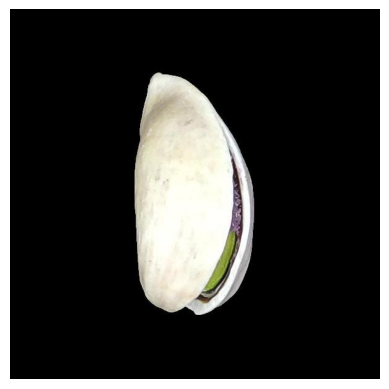

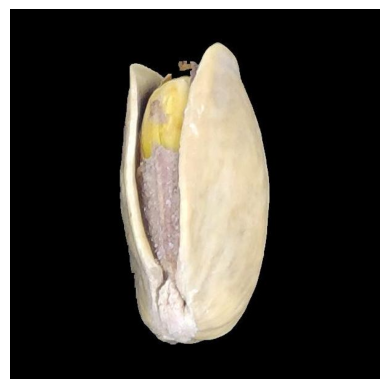

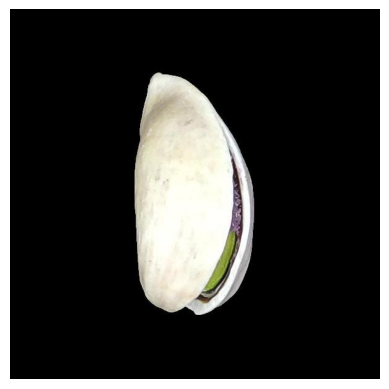

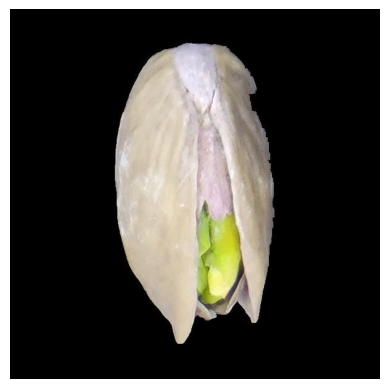

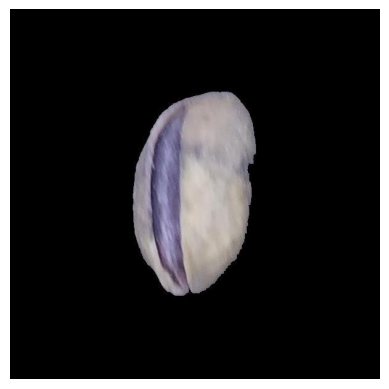

...

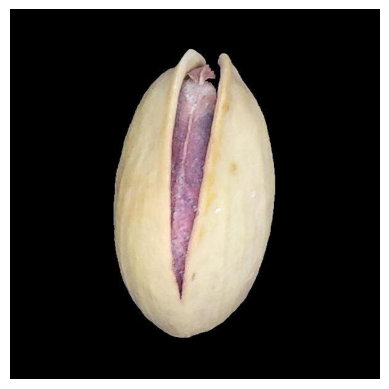

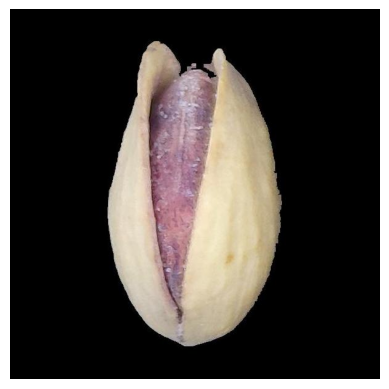

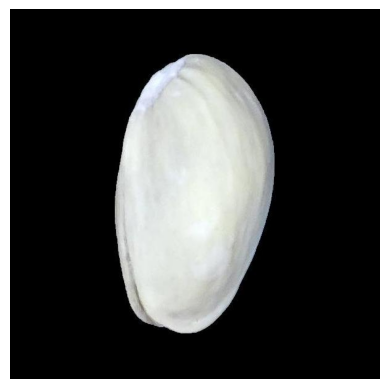

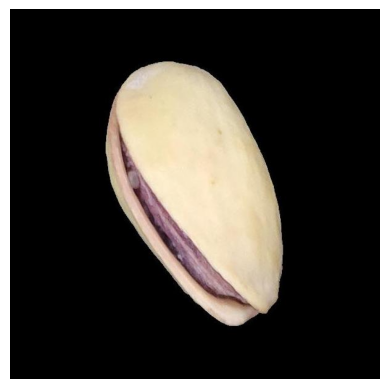

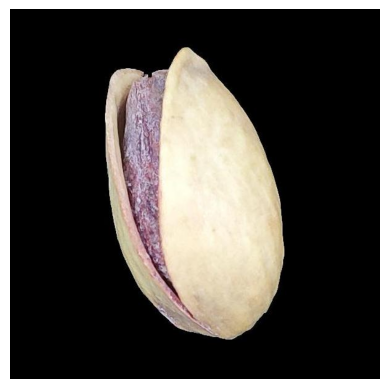

In [23]:
for i in df[df['class']==-1]['path_of_files']:
    img_path = i
    img = Image.open(img_path)
    plt.imshow(img)
    plt.axis('off')  # Hide axes
    plt.show()

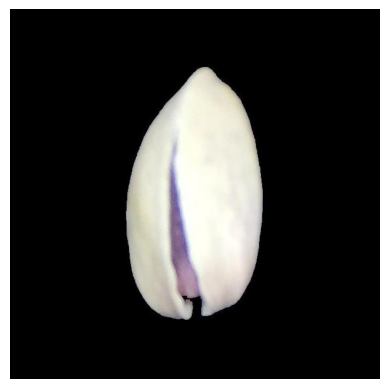

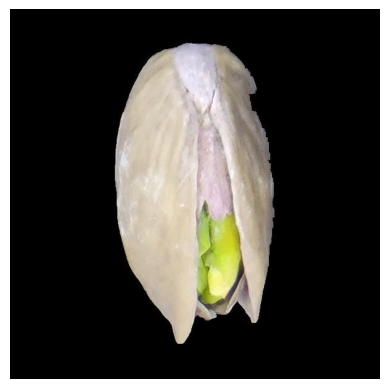

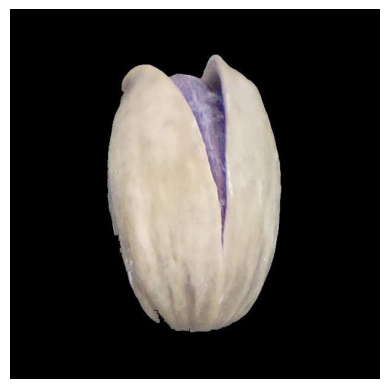

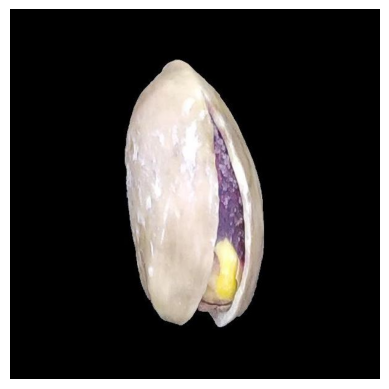

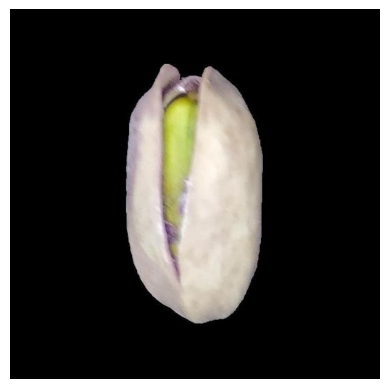

...

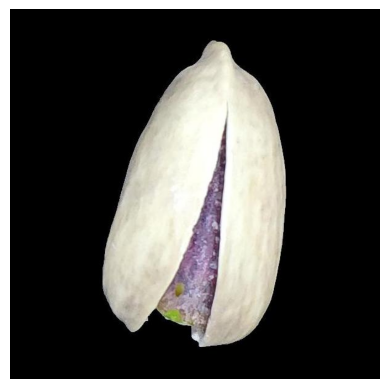

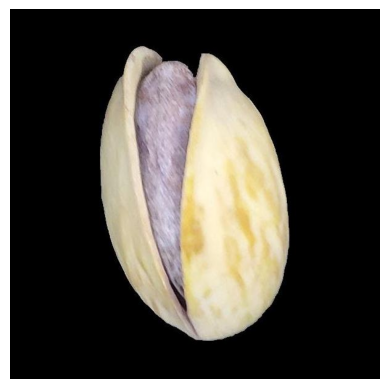

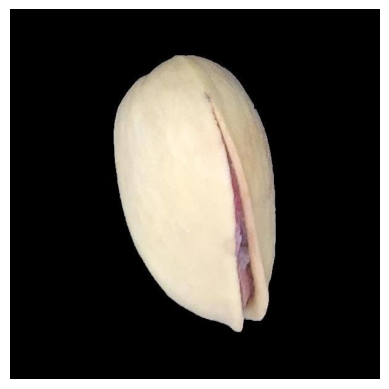

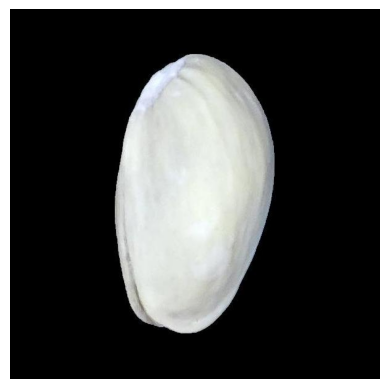

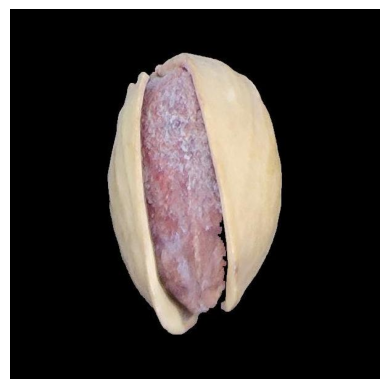

In [29]:
for i in df[df['class']==1]['path_of_files']:
    img_path = i
    img = Image.open(img_path)
    plt.imshow(img)
    plt.axis('off')  # Hide axes
    plt.show()